# Conditional Impulse Response Functions

In [1]:
!pip install statsmodels==0.12.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 9.5 MB 8.3 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd
import numpy as np
from tqdm.auto import tqdm
from tqdm.notebook import tqdm, trange
import copy
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import itertools
from statsmodels.tsa.ar_model import AutoReg
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import os

from sklearn.linear_model import LinearRegression
import random
from datetime import datetime
from statsmodels.tsa.api import VAR

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
root_dir = 'drive/MyDrive/EconML DL/Fall 2021'

## Load Data

In [ ]:
# Load Data - 3-variable Quarterly

data = pd.read_csv('drive/MyDrive/EconML DL/6var_quarterly.csv')
data['DATE'] = data['DATE'].apply(lambda x: datetime.strptime(x, '%m/%d/%Y'))
data['CPIAUCSL'] = np.log(data['CPIAUCSL'])
data['SP500'] = np.log(data['SP500'])
data['WTISPLC'] = np.log(data['WTISPLC'])
data['EXUSUK'] = np.log(data['EXUSUK'])
data = data.set_index('DATE')
x_d = data.diff().dropna()
# x_d = x_d.iloc[:, [0, 1, 5, 4, 2, 3]]
# x_d.columns = ['oil', 'Ex', 'SPY', 'DGS3', 'inf', 'unrate']
# x_d_colnames = x_d.columns

x_d = x_d.iloc[:, [4,2,3]]
x_d.columns = ['DGS3', 'Inflation', 'Unrate']
x_d_colnames = x_d.columns
var_names = list(x_d_colnames)
n_var = len(var_names)

In [ ]:
# Loading the Data

data = pd.read_csv('drive/MyDrive/EconML DL/Forecasting/monthlyData.csv')
x_d = data[['L0_OILPRICEx', 'L0_EXUSUKx', 'L0_S.P.500', 'L0_TB3MS', 'L_0y', 'L0_UNRATE']]
x_d.columns = ['oil', 'Ex', 'SPY', 'DGS3', 'inf', 'lclaim_int']
x_d_colnames = x_d.columns

In [6]:
# 7-variables quarterly
data = pd.read_csv('drive/MyDrive/EconML DL/Forecasting/monthlyData.csv')
data['quarter'] = ((data['trend'] ) / 3).astype(int)
data = data.groupby('quarter').mean().reset_index()
data['L0_HOUST'] = data['L0_HOUST'].diff()
data = data.dropna()
x_d = data[['L0_OILPRICEx', 'L0_EXUSUKx', 'L0_S.P.500', 'L0_TB3MS', 'L_0y', 'L0_UNRATE', 'L0_HOUST']]
x_d.columns = ['oil', 'Ex', 'SPY', 'DGS3', 'inf', 'unrate', 'house_starts']
x_d_colnames = x_d.columns
n_vars = len(x_d.columns)
var_names = list(x_d_colnames)

In [ ]:
# Loading the Data - 7 Variables

# data = pd.read_csv('drive/MyDrive/EconML DL/Forecasting/monthlyData.csv')
# data['DATE'] = data['Unnamed: 0'].apply(lambda x: datetime.strptime(x, '%m/%d/%Y'))
# data = data.set_index('DATE')
# x_d = data[['L0_OILPRICEx', 'L0_EXUSUKx', 'L0_S.P.500', 'L0_TB3MS', 'L_0y', 'L0_UNRATE', 'L0_HOUST']]
# x_d['L0_HOUST'] = x_d['L0_HOUST'].diff()
# x_d = x_d.dropna()
# x_d.columns = ['oil', 'Ex', 'SPY', 'DGS3', 'inf', 'lclaim_int', 'house_starts']
# x_d_colnames = x_d.columns
# n_var = len(x_d.columns)
# var_names = list(x_d_colnames)

data = pd.read_csv('drive/MyDrive/EconML DL/Forecasting/monthlyData.csv')
x_d_all = data[['L0_OILPRICEx', 'L0_EXUSUKx', 'L0_S.P.500', 'L0_TB3MS', 'L_0y', 'L0_UNRATE', 'L0_HOUST']]
x_d_all['L0_HOUST'] = x_d_all['L0_HOUST'].diff()
x_d_all = x_d_all.dropna()
x_d_all.columns = ['oil', 'Ex', 'SPY', 'DGS3', 'inf', 'unrate', 'house_starts']

# Get down to 3 variables
x_d = x_d_all[['inf', 'unrate', 'DGS3']]
x_d.columns = ['Interest', 'Inf', 'Unemp']
x_d = x_d.iloc[:-20, :]
x_d_colnames = x_d.columns
n_var = len(x_d.columns)
var_names = list(x_d_colnames)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


In [ ]:
data = pd.read_csv('drive/MyDrive/EconML DL/ryan_data_h1.csv')
data = data.dropna()
x_d = data[['Y_sp', 'Y_nas', 'Y_vix', 'Y_dj']]
x_d.columns = ['S&P', 'NASDAQ', 'VIX', 'DJIA']
x_d_colnames = x_d.columns
n_var = len(x_d.columns)
var_names = list(x_d_colnames)

In [5]:
data = pd.read_csv('drive/MyDrive/EconML DL/VARCTIC8.csv')
data = data.dropna()
x_d_all = data[['CO2_MaunaLoa', 'TCC', 'PR', 'AT', 'SST', 'SIE', 'SIT', 'Albedo']]
x_d_all.columns = ['CO2_MaunaLoa', 'TCC', 'PR', 'AT', 'SST', 'SIE', 'SIT', 'Albedo']
x_d_all_colnames = x_d_all.columns
n_var = len(x_d_all.columns)
var_names = list(x_d_all_colnames)

## Plotting Conditional IRFs from Data

In [18]:
# Only need to change experiment information here
experiment_name = '7jul_quarterly'
folder_path = f'drive/MyDrive/EconML DL/New Experiments/{experiment_name}'
param_num = 1

# Create image folder if not exist yet
image_folder_path = f'{folder_path}/images'
if os.path.isdir(image_folder_path) == False:
  os.mkdir(image_folder_path)

# Load the saved VARNN model output
results = np.load(f'{folder_path}/params_{param_num}_repeat_0.npz', allow_pickle = True)
BETAS = results['betas']
BETAS_IN = results['betas_in']
PREDS = results['train_preds']
PREDS_TEST = results['test_preds']
SIGMAS = results['sigmas']
SIGMAS_IN = results['sigmas_in']
params = results['params']
Y = results['y']

In [19]:
n_obs = BETAS.shape[0]
n_betas = BETAS.shape[1]
n_bootstraps = BETAS.shape[2]
n_var = BETAS.shape[3]
n_lags = int((n_betas - 1) / n_var)

#var_names = ['inf', 'unrate', 'DGS3']

max_h = 20

In [ ]:
### Time-invariant covariance matrix

# # Calculate the covariance matrices
# COV_MATS = np.zeros((n_bootstraps, n_var, n_var))

# # Expand the dimensions of Y so we can compare with PREDS
# Y = np.expand_dims(Y, axis = 1)
# Y = np.repeat(Y, PREDS.shape[1], axis = 1)

# # Get residuals: n_obs x n_bootstraps x n_var
# RESIDS = Y - PREDS

# # Estimat the TIME-INVARIANT covariance matrix for each bootstrap iteration
# for boot in range(n_bootstraps):
#   COV_MATS[boot, :, :] = pd.DataFrame(RESIDS[:, boot, :]).dropna().cov()

### Actual IRF Generation Code

In [9]:
# @title Function to get IRF for One Draw

def get_irf_draw(beta_draw, cov_mat_draw = None):

  # Rearranging the betas so they fit into A matrix
  constant = beta_draw[:, 0]

  A_L_mats = []
  for i in range(n_lags):
    A_L_mats.append(beta_draw[:, list(range(i+1, n_betas, n_lags))])
  
  # Form the A matrix
  A = np.array(A_L_mats)

  # Generalized Code to construct companion matrix
  p, k = A.shape[0], A.shape[1]
  comp_mat = np.zeros((p*k, p*k))

  for i in range(p):
    comp_mat[0:k, (k*i):(k*(i+1))] = A[i, :, :]

  for i in range((p-1)*k):
    comp_mat[k+i, i] = 1

  # Contemporaneous covariance matrix: k x k
  if cov_mat_draw is None:
    cov_mat_draw = np.identity(n_var)

  # Do Cholesky decomposition
  C = np.linalg.cholesky(cov_mat_draw)

  # Construct the companion C matrix
  C_mat = np.zeros((p*k, p*k))
  for i in range(p):
    C_mat[(k*i):(k*(i+1)), (k*i):(k*(i+1))] = C

  # shock var x response var x h
  irf_draw = np.zeros((n_var, n_var * n_lags, max_h))

  for h in range(max_h):
    for var in range(n_var):
      shock_vec = np.zeros((n_var * n_lags,))
      shock_vec[var] = 1.0
      irf_draw[var, :, h] = np.matmul(np.linalg.matrix_power(comp_mat, h), np.matmul(C_mat, shock_vec))

  # Cut off the repeated second half of the IRF matrix
  irf_draw = irf_draw[:, 0:n_var, :]

  return irf_draw

In [10]:
# @title Get the Median IRFs across all draws

# Execution code: Compute the conditional IRFs for each bootstrap draw
# Note: If you want to use estimated covariance matrix, then change cov_mat_draw parameter to cov_mat_draw, otherwise None makes it identity matrix

def get_irfs(BETAS, SIGMAS):

  n_obs = BETAS.shape[0]
  n_bootstraps = BETAS.shape[2]
  n_var = BETAS.shape[3]

  IRFS = np.zeros((n_obs, n_bootstraps, n_var, n_var, max_h))
  IRFS[:] = np.nan

  for t in range(n_obs):
    if t % 100 == 0:
      print(f'Simulation timestep {t} at {datetime.now()}')
    for boot in range(n_bootstraps):
      
      # Can change BETAS_IN or BETAS
      beta_draw = BETAS[t, :, boot, :].T

      # # Get the time-invariant cov mat
      #cov_mat_draw = COV_MATS[boot, :, :]
      # Get the time-varying cov mat
      cov_mat_draw = SIGMAS[t, :, :, boot]

      IRFS[t, boot, :, :, :] = get_irf_draw(beta_draw, cov_mat_draw = cov_mat_draw)

  # Get the median of the IRF draws
  IRFS_median = np.nanmedian(IRFS, axis = 1)
  
  return IRFS_median

In [20]:
BETAS_IN_all_hemi = np.nansum(BETAS_IN, axis = -1)

In [12]:
# Computing the IRFs in chunks (if the data is too big and too many lags in VAR)

chunk_size = 100
n_chunks = int(BETAS_IN_all_hemi.shape[0] / chunk_size) + 1

for chunk in range(n_chunks):
  start_id = chunk * chunk_size
  end_id = (chunk+1) * chunk_size if (chunk != (n_chunks -1)) else BETAS_IN_all_hemi.shape[0]
  BETAS_chunk = BETAS_IN_all_hemi[start_id:end_id, :, :, :]
  SIGMAS_chunk = SIGMAS_IN[start_id:end_id, :, :, :]

  IRFS_chunk = get_irfs(BETAS_chunk, SIGMAS_chunk)

  print(f'Done with Chunk {chunk} at {datetime.now()}')

  with open(f'{folder_path}/irf_chunk_{chunk}.npz', 'wb') as f:
    np.save(f, IRFS_chunk)

Simulation timestep 0 at 2022-07-08 12:12:35.365240
Done with Chunk 0 at 2022-07-08 12:14:16.856992
Simulation timestep 0 at 2022-07-08 12:14:16.894292
Done with Chunk 1 at 2022-07-08 12:16:02.649560
Simulation timestep 0 at 2022-07-08 12:16:02.685095
Done with Chunk 2 at 2022-07-08 12:17:44.914924
Simulation timestep 0 at 2022-07-08 12:17:44.950826


/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1120: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


Done with Chunk 3 at 2022-07-08 12:19:26.066957
Simulation timestep 0 at 2022-07-08 12:19:26.101928
Done with Chunk 4 at 2022-07-08 12:21:01.999415


In [26]:
chunk_size = 100
n_chunks = int(BETAS_IN_all_hemi.shape[0] / chunk_size) + 1

# Load and combine all the chunks
IRFS_estimated = np.zeros((n_obs, n_var, n_var, max_h))

for chunk in range(n_chunks):
  start_id = chunk * chunk_size
  end_id = (chunk+1) * chunk_size if (chunk != (n_chunks -1)) else BETAS_IN_all_hemi.shape[0]

  IRFS_estimated[start_id:end_id, :, :, :] = np.load(f'{folder_path}/irf_chunk_{chunk}.npz')

In [21]:
# Sum the betas from all hemis (all at one go)
IRFS_estimated = get_irfs(BETAS_IN_all_hemi, SIGMAS_IN)

Simulation timestep 0 at 2022-07-08 14:59:25.308482
Simulation timestep 100 at 2022-07-08 14:59:51.150474
Simulation timestep 200 at 2022-07-08 15:00:17.812471


/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1120: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


In [ ]:
### Get the ground truth IRFs

sim_data = np.load(f'drive/MyDrive/EconML DL/simulation_data_joint_21jun.npz', allow_pickle = True)
cov_mat_tv_all = sim_data['cov_mat_tv_all'] 
coefs_tv_all = sim_data['coefs_tv_all']
exog_all = sim_data['exog_all']

sim_dataset = 0

cov_mat_tv = cov_mat_tv_all[8:, :, :, sim_dataset]
coefs_tv = coefs_tv_all[8:, :, :, sim_dataset]
exog = exog_all[8:, :, sim_dataset]

In [ ]:
### Convert coefs_tv and covs_mat_tv into appropriate form

# Swap around the constant coef to the front (from the back)
coefs_tv = coefs_tv[:, :, [3,0,1,2]]
coefs_tv = np.transpose(coefs_tv, (0, 2, 1))
coefs_tv = np.expand_dims(coefs_tv, axis = 2)
cov_mat_tv = np.expand_dims(cov_mat_tv, axis = -1)

In [ ]:
IRFS_actual = get_irfs(coefs_tv, cov_mat_tv)

### Draw Heatmap

In [ ]:
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as colors

In [ ]:
# @title Set the colormap 

# Sets the color map and centre the colorbar
class MidpointNormalize(colors.Normalize):
	"""
	Normalise the colorbar so that diverging bars work there way either side from a prescribed midpoint value)

	e.g. im=ax1.imshow(array, norm=MidpointNormalize(midpoint=0.,vmin=-100, vmax=100))
	"""
	def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
		self.midpoint = midpoint
		colors.Normalize.__init__(self, vmin, vmax, clip)

	def __call__(self, value, clip=None):
		# I'm ignoring masked values and all kinds of edge cases to make a
		# simple example...
		x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
		return np.ma.masked_array(np.interp(value, x, y), np.isnan(value))

In [15]:
# Create image folder if not exist yet
image_folder_path = f'{folder_path}/images'
if os.path.isdir(image_folder_path) == False:
  os.mkdir(image_folder_path)

In [ ]:
IRFS_median = IRFS_median[:174, :, :, :]

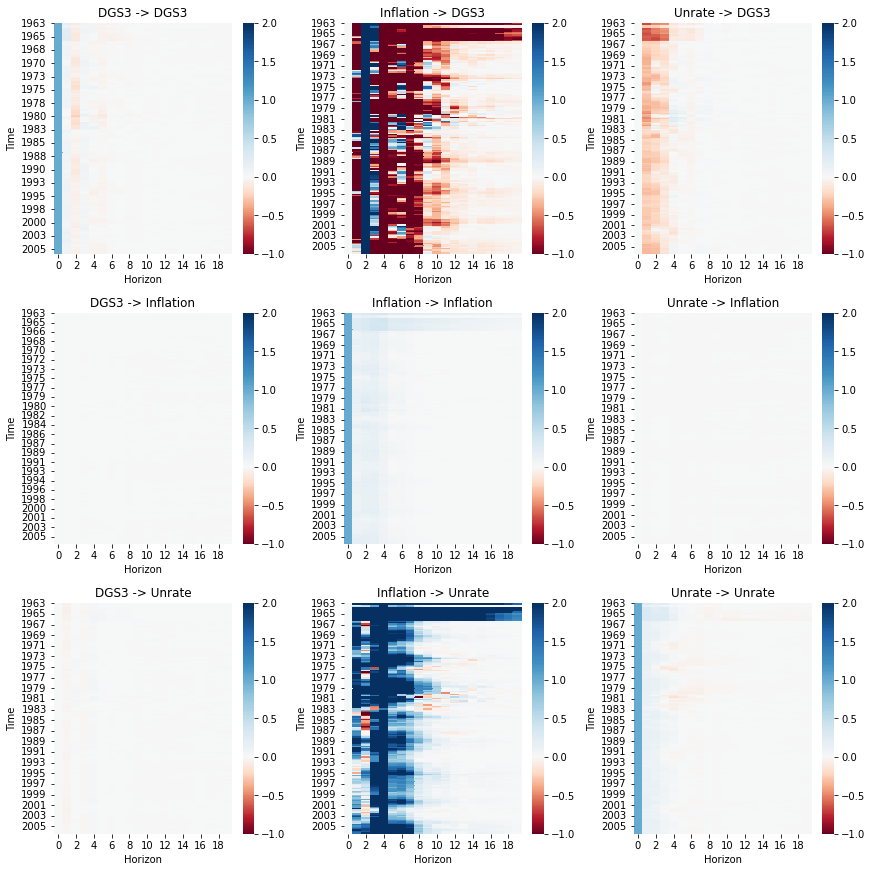

In [ ]:
dates = pd.Series(data.iloc[9:-60, :].index).apply(lambda x: x.strftime('%Y'))
#dates = pd.to_datetime(data.iloc[9:, 0]).apply(lambda x: x.strftime('%Y'))
fig, ax = plt.subplots(n_var, n_var, constrained_layout = True, figsize = (4 * n_var, 4 * n_var))

for k in range(n_var):
  for kk in range(n_var):

    irf_df = pd.DataFrame(IRFS_median[:, k, kk, :], index = dates)
    sns.heatmap(irf_df, ax = ax[kk, k], cmap = 'RdBu', norm = MidpointNormalize(midpoint = 0, vmin = -1, vmax = 2))
    ax[kk, k].set_xlabel('Horizon')
    ax[kk, k].set_ylabel('Time')
    ax[kk, k].set_title(f'{var_names[k]} -> {var_names[kk]}')

plt.savefig(f'{image_folder_path}/conditional_irf.png')

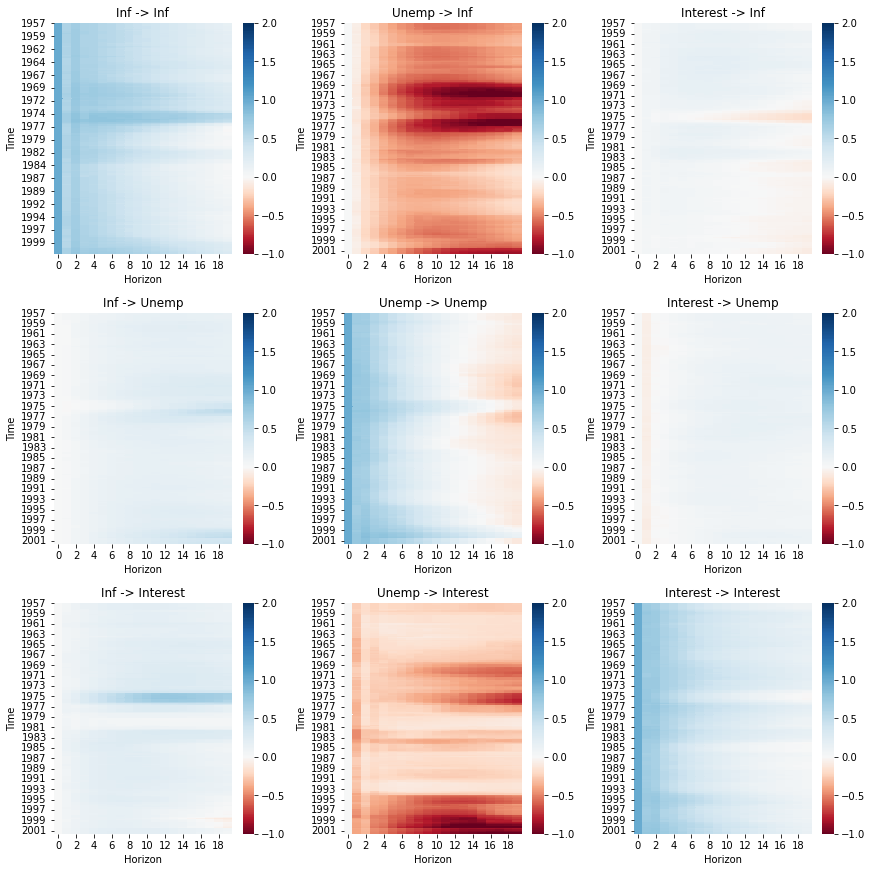

In [ ]:
# Draws the conditional IRFs as a heatmap

dates = pd.Series(x_d.index[16:].to_pydatetime()).apply(lambda x: x.strftime('%Y'))

fig, ax = plt.subplots(n_var, n_var, constrained_layout = True, figsize = (4 * n_var, 4 * n_var))
var_names = ['Inf', 'Unemp', 'Interest']

for k in range(n_var):
  for kk in range(n_var):

    irf_df = pd.DataFrame(IRFS_median[:, k, kk, :], index = dates)
    sns.heatmap(irf_df, ax = ax[kk, k], cmap = 'RdBu', norm = MidpointNormalize(midpoint = 0, vmin = -1, vmax = 2))
    ax[kk, k].set_xlabel('Horizon')
    ax[kk, k].set_ylabel('Time')
    ax[kk, k].set_title(f'{var_names[k]} -> {var_names[kk]}')

### Drawing Multiple Conditional IRFs in one graph

In [17]:
data.iloc[[50,150,250,350], :]

,Unnamed: 0,CO2_MaunaLoa,TCC,PR,AT,SST,SIE,SIT,Albedo
50,1984m3,344.26,48.768466,1.594211,4.329482,0.128000,6.328486,1.771764,0.286719
150,1992m7,356.58,49.873161,1.643470,5.083205,0.010405,7.217509,1.845532,0.293919
250,2000m11,370.48,48.680527,1.647634,5.458933,0.363238,5.867902,1.634437,0.284872
350,2009m3,387.54,50.504150,1.579682,5.506154,0.370000,5.728486,1.442926,0.286559


In [27]:
# Dates for the 4-variable financial data
#dates = pd.to_datetime(data['index'].iloc[100:]).apply(lambda x: x.strftime('%Y-%m'))

#561: August 2015 (dropped 4% in one day)
#1000: May 2017 (market is quite calm)
#1344: Oct 2018
#1694: March 2020 (dropped 8% in one day)


# Select the 4 indexes that you want to draw IRFs for 
# times_to_draw = [561, 1000, 1344, 1694]
# # Labels for the times you want to draw the IRFs for
# times_to_draw_labels = ['2015-8', '2017-5', '2018-10', '2020-3']

times_to_draw = [50, 150, 250, 350]
times_to_draw_labels = ['1984-3', '1992-7', '2000-11', '2009-3']

cmap = plt.cm.tab10

In [ ]:
# dates = pd.Series(data.iloc[9:-60, :].index).apply(lambda x: x.strftime('%Y'))

# # Select the 4 indexes that you want to draw IRFs for 
# times_to_draw = [90, 210, 330, 450]
# # Labels for the times you want to draw the IRFs for
# times_to_draw_labels = [1968, 1978, 1988, 1998]

# cmap = plt.cm.tab10

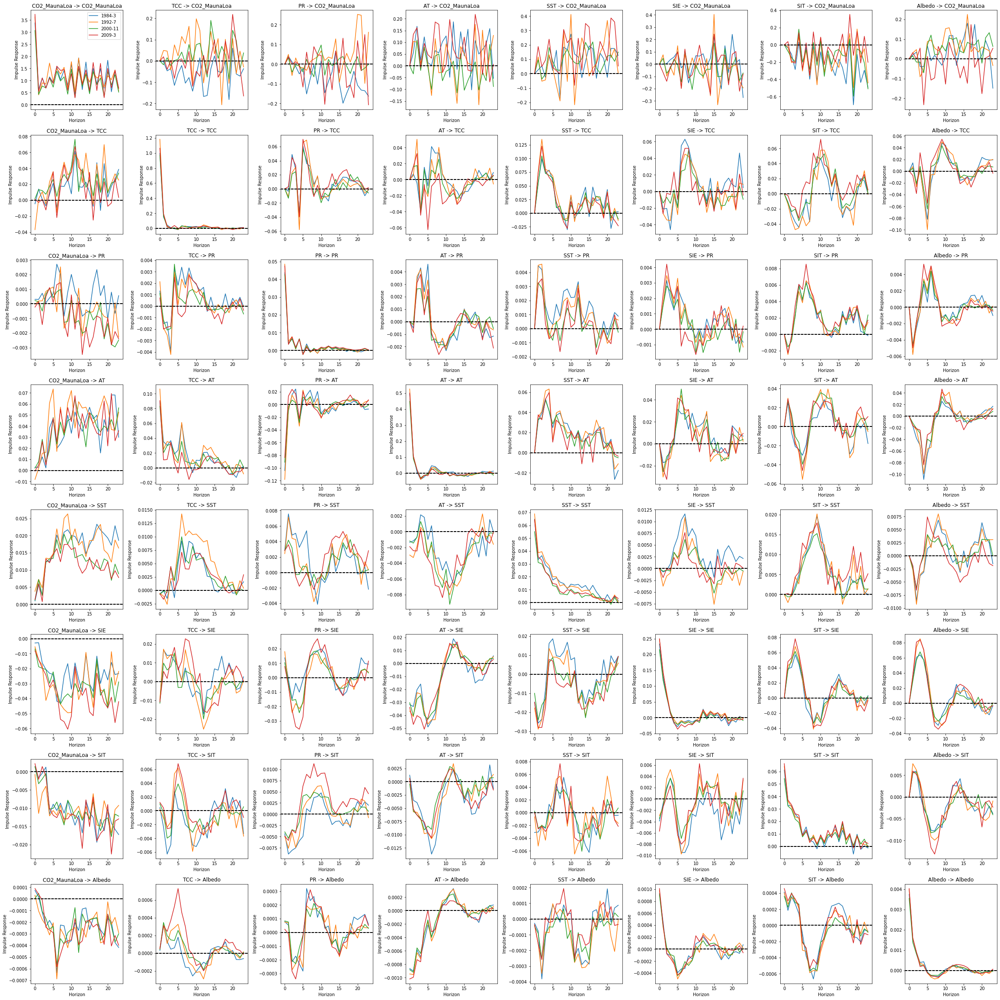

In [28]:
### Compare conditional IRFs to actual IRFs

fig, ax = plt.subplots(n_var, n_var, constrained_layout = True, figsize = (4 * n_var, 4 * n_var))

for k in range(n_var):
  for kk in range(n_var):
    for i in range(len(times_to_draw)):
      irf_df = IRFS_estimated[times_to_draw[i], k, kk, :]
      ax[kk, k].plot(irf_df, label = times_to_draw_labels[i], color = cmap(i))

      #irf_actual_df = IRFS_actual[times_to_draw[i], k, kk, :]
      #ax[kk, k].plot(irf_actual_df, label = str(times_to_draw_labels[i]) + ' Actual', ls = '--', color = cmap(i))
      ax[kk, k].set_xlabel('Horizon')
      ax[kk, k].set_ylabel('Impulse Response')
      ax[kk, k].axhline(y = 0, color = 'black', ls = '--')
      ax[kk, k].set_title(f'{var_names[k]} -> {var_names[kk]}')
    if k == 0 and kk == 0:
      ax[kk, k].legend()

image_file = f'{image_folder_path}/irf_conditional.png'
plt.savefig(image_file)

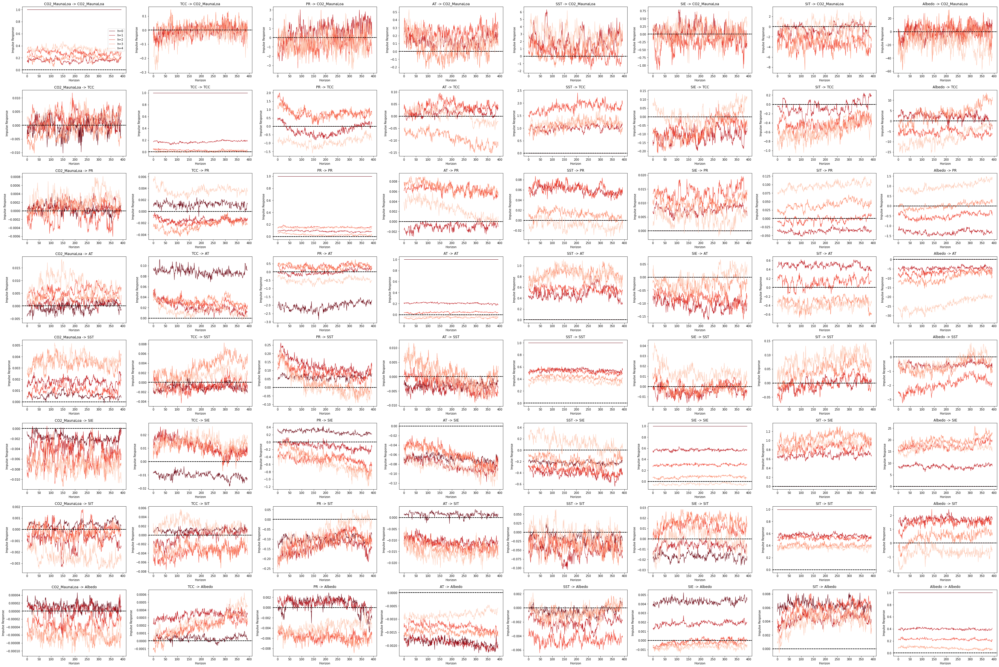

In [29]:
### Compare conditional IRFs to actual IRFs - 1st horizon response over all time periods
cmap = plt.cm.Reds(np.linspace(1,0,6))
fig, ax = plt.subplots(n_var, n_var, constrained_layout = True, figsize = (6 * n_var, 4 * n_var))

for k in range(n_var):
  for kk in range(n_var):
    for h in [0,1,2,3,4]:
      irf_df = IRFS_estimated[:, k, kk, h]
      irf_df_pct = irf_df / IRFS_estimated[:, k, k, 0] # Divide IRF by the time-0 of 
      ax[kk, k].plot(irf_df_pct, label = f'h={h}', color = cmap[h], lw = 1)

      #irf_actual_df = IRFS_actual[:, k, kk, h]
      #ax[kk, k].plot(irf_actual_df, label = f'h={h} Actual', color = 'black')
      ax[kk, k].set_xlabel('Horizon')
      ax[kk, k].set_ylabel('Impulse Response')
      ax[kk, k].axhline(y = 0, color = 'black', ls = '--')
      ax[kk, k].set_title(f'{var_names[k]} -> {var_names[kk]}')
    if k == 0 and kk == 0:
      ax[kk, k].legend()

image_file = f'{image_folder_path}/irf_conditional_over_time.png'
plt.savefig(image_file)

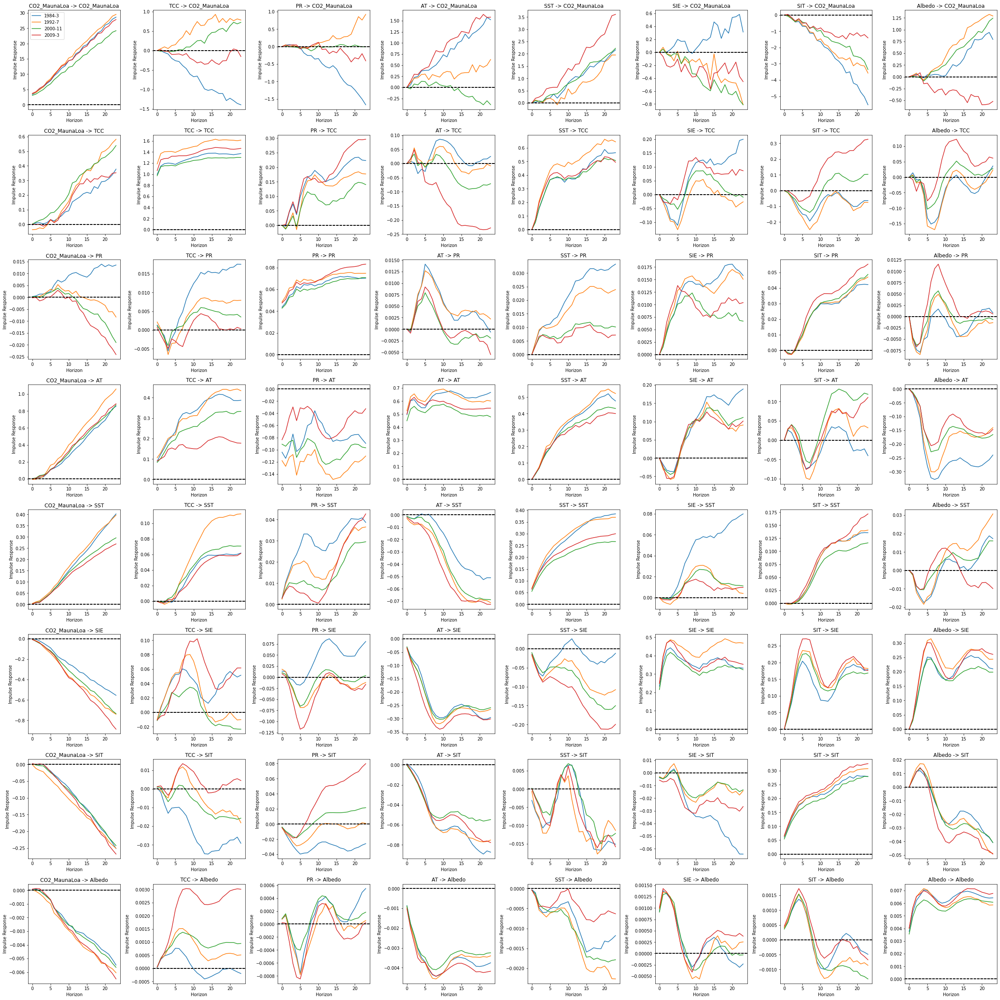

In [30]:
# Draw Conditional Cumulative IRFs

fig, ax = plt.subplots(n_var, n_var, constrained_layout = True, figsize = (4 * n_var, 4 * n_var))
#var_names = ['Inf', 'Unemp', 'Interest']

for k in range(n_var):
  for kk in range(n_var):
    for i in range(len(times_to_draw)):
      irf_df = IRFS_estimated[times_to_draw[i], k, kk, :]
      ax[kk, k].plot(irf_df.cumsum(), label = times_to_draw_labels[i])
      ax[kk, k].set_xlabel('Horizon')
      ax[kk, k].set_ylabel('Impulse Response')
      ax[kk, k].axhline(y = 0, color = 'black', ls = '--')
      ax[kk, k].set_title(f'{var_names[k]} -> {var_names[kk]}')
    if k == 0 and kk == 0:
      ax[kk, k].legend()

image_file = f'{image_folder_path}/irf_conditional_cumulative.png'
plt.savefig(image_file)

### Computing Unconditional IRFs to compare

In [ ]:
### Computing the Unconditional IRFs
x_d = x_d[['inf', 'lclaim_int', 'DGS3']]

# Estimate the VAR so we can do impulse responses
var_model_estimated = VAR(x_d)
var_fit = var_model_estimated.fit(2)
#var_fit.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


In [ ]:
var_cov_mat = np.array(var_fit.resid.cov())
var_cov_mat

array([[ 5.70069556e-06, -8.55276632e-05,  8.38496707e-05],
       [-8.55276632e-05,  1.90285867e-01, -9.23825438e-03],
       [ 8.38496707e-05, -9.23825438e-03,  1.46328574e-01]])

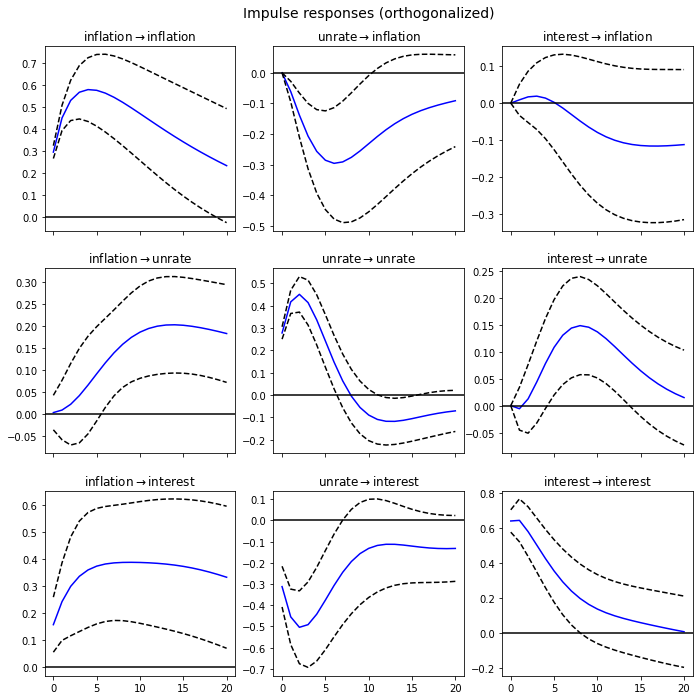

In [ ]:
# Plot the IRFs
irf = var_fit.irf(20)
irf_plot = irf.plot(orth = True)

### Additional Optional Code (Plotting Betas)

In [ ]:
# @title Plot All Beta Paths

def plot_betas_all(BETAS, q = 0.16, title = 'Betas'):

  n_vars = BETAS.shape[3]
  n_bootstraps = BETAS.shape[2]
  n_betas = BETAS.shape[1]
  n_obs = BETAS.shape[0]

  var_names = ['Inf', 'Unemp', 'Interest']
  beta_names = ['Constant', 'Inf_L0', 'Inf_L1', 'Unemp_L0', 'Unemp_L1', 'Interest_L0', 'Interest_L1']
  #beta_names = ['Constant', 'Inf_L0', 'Unemp_L0', 'Interest_L0']

  fig, axs = plt.subplots(n_vars, n_betas, figsize = (8 * n_betas, 4 * n_vars), constrained_layout = True)

  for var in range(n_vars):
    for beta in range(n_betas):

      # Get the quantiles
      betas_lcl = np.nanquantile(BETAS[:, beta, :, var], q = q, axis = 1)
      betas_ucl = np.nanquantile(BETAS[:, beta, :, var], q = 1 - q, axis = 1)
      betas_median = np.nanmean(BETAS[:, beta, :, var], axis = 1)

      betas_median = pd.Series(betas_median, index = dates)
      betas_lcl = pd.Series(betas_lcl, index = dates)
      betas_ucl = pd.Series(betas_ucl, index = dates)

      # Plot all 250 lines
      for i in range(n_bootstraps):
        axs[var, beta].plot(pd.Series(BETAS[:, beta, i, var], index = dates), lw = 0.5, alpha = 0.5)

      axs[var, beta].plot(betas_median, label = f'{var_names[var]} {beta_names[beta]}', lw = 1.5, color = 'black')
      # Plot the confidence bands
      axs[var, beta].plot(betas_lcl, label = f'{var_names[var]} {beta_names[beta]}', lw = 1.5, color = 'black', ls = '--')
      axs[var, beta].plot(betas_ucl, label = f'{var_names[var]} {beta_names[beta]}', lw = 1.5, color = 'black', ls = '--')

      # Vertical line for train/test split
      #axs[var, beta].axvline(results['oos_index'][0], color = 'black', linewidth = 1, linestyle = '--')
      # Horizontal line for OLS estimation
      #axs[var, beta].axhline(coefs_matrix[var, beta], color = 'green', linewidth = 1)

      #axs[var, beta].set_xticks(dates)

      axs[var, beta].set_title(f'{var_names[var]}, {beta_names[beta]}')
      axs[var, beta].set_xlabel('Time')
      axs[var, beta].set_ylabel('Coefficient')
  plt.title('')


In [ ]:
dates = pd.Series(x_d.index[16:].to_pydatetime())

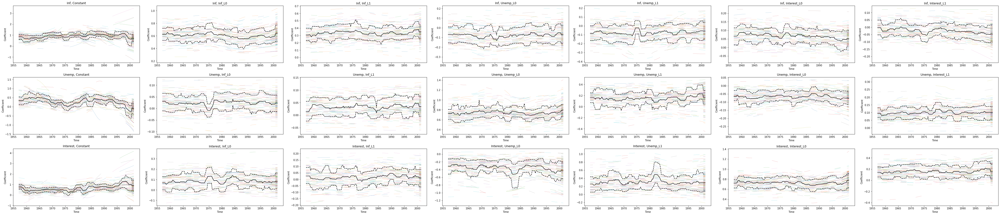

In [ ]:
plot_betas_all(BETAS)

In [ ]:
plot_betas_all(BETAS_IN)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# @title Original Plot Betas

def plot_betas(BETAS, q = 0.16, title = 'Betas'):

  n_vars = BETAS.shape[3]
  n_betas = BETAS.shape[1]
  n_obs = BETAS.shape[0]

  # var_names = ['FFR', 'Claims', 'Inf']
  # beta_names = ['Constant', 'FFR_L0', 'FFR_L1', 'Claims_L0', 'Claims_L1', 'Inf_L0', 'Inf_L1']

  #var_names = ['Oil', 'Claims', 'Inf']
  #beta_names = ['Constant', 'Oil_L0', 'Oil_L1', 'Claims_L0', 'Claims_L1', 'Inf_L0', 'Inf_L1']

  var_names = ['Inf', 'Unemp', 'Interest']
  beta_names = ['Constant', 'Inf_L0', 'Inf_L1', 'Unemp_L0', 'Unemp_L1', 'Interest_L0', 'Interest_L1']
  #beta_names = ['Constant', 'Inf_L0', 'Unemp_L0', 'Interest_L0']

  fig, axs = plt.subplots(n_vars, n_betas, figsize = (6 * n_betas, 3 * n_vars), constrained_layout = True)

  for var in range(n_vars):
    for beta in range(n_betas):

      # Get the quantiles
      betas_lcl = np.nanquantile(BETAS[:, beta, :, var], q = q, axis = 1)
      betas_ucl = np.nanquantile(BETAS[:, beta, :, var], q = 1 - q, axis = 1)
      betas_median = np.nanmean(BETAS[:, beta, :, var], axis = 1)

      betas_median = pd.Series(betas_median, index = dates)
      betas_lcl = pd.Series(betas_lcl, index = dates)
      betas_ucl = pd.Series(betas_ucl, index = dates)

      axs[var, beta].plot(betas_median, label = f'{var_names[var]} {beta_names[beta]}', lw = 0.5)
      # Plot the confidence bands
      axs[var, beta].fill_between(dates, betas_lcl, betas_ucl, alpha = 0.5)
      # Vertical line for train/test split
      #axs[var, beta].axvline(results['oos_index'][0], color = 'black', linewidth = 1, linestyle = '--')
      # Horizontal line for OLS estimation
      #axs[var, beta].axhline(coefs_matrix[var, beta], color = 'green', linewidth = 1)

      #axs[var, beta].set_xticks(dates)

      axs[var, beta].set_title(f'{var_names[var]}, {beta_names[beta]}')
      axs[var, beta].set_xlabel('Time')
      axs[var, beta].set_ylabel('Coefficient')
  plt.title('')

  plt.savefig('betas.png')

In [ ]:
# @title Plot Betas Univariate

def plot_betas_univariate(BETAS, q = 0.16, title = 'Betas'):

  n_vars = BETAS.shape[3]
  n_betas = BETAS.shape[1]
  n_obs = BETAS.shape[0]

  var_names = ['']
  beta_names = ['Constant', 'L0', 'L1']

  fig, axs = plt.subplots(1, n_betas, figsize = (6 * n_betas, 3 * n_vars), constrained_layout = True)

  for beta in range(n_betas):

    # Get the quantiles
    betas_lcl = np.nanquantile(BETAS[:, beta, :, 0], q = q, axis = 1)
    betas_ucl = np.nanquantile(BETAS[:, beta, :, 0], q = 1 - q, axis = 1)
    betas_median = np.nanmean(BETAS[:, beta, :, 0], axis = 1)

    betas_median = pd.Series(betas_median, index = dates)
    betas_lcl = pd.Series(betas_lcl, index = dates)
    betas_ucl = pd.Series(betas_ucl, index = dates)

    axs[beta].plot(betas_median, label = f'{beta_names[beta]}', lw = 0.5)
    # Plot the confidence bands
    axs[beta].fill_between(dates, betas_lcl, betas_ucl, alpha = 0.5)
    # Vertical line for train/test split
    #axs[beta].axvline(results['oos_index'][0], color = 'black', linewidth = 1, linestyle = '--')
    # Horizontal line for OLS estimation
    #axs[beta].axhline(coefs_matrix[var, beta], color = 'green', linewidth = 1)
    #axs[beta].set_xticks(dates)

    axs[beta].set_title(f'{beta_names[beta]}')
    axs[beta].set_xlabel('Time')
    axs[beta].set_ylabel('Coefficient')


In [ ]:
# @title Plot Betas Old

def plot_betas(BETAS, q = 0.16, title = 'Betas'):

  # n_vars = BETAS.shape[4]
  # n_betas = BETAS.shape[2]
  # n_obs = BETAS.shape[1]

  #var_names = ['oil', 'Ex', 'SPY', 'DGS3', 'inf', 'lclaim_int']
  #beta_names = ['constant', 'oil', 'Ex', 'SPY', 'DGS3', 'inf', 'lclaim_int']

  #var_names = ['Oil', 'Inf', 'Claims']
  #beta_names = ['Constant', 'Oil_L0', 'Oil_L1','Inf_L0', 'Inf_L1','Claims_L0', 'Claims_L1']

  # var_names = ['Oil', 'Claims', 'Inf']
  # beta_names = ['Constant', 'Oil_L0', 'Oil_L1', 'Claims_L0', 'Claims_L1', 'Inf_L0', 'Inf_L1']

  var_names = ['FFR', 'Claims', 'Inf']
  beta_names = ['Constant', 'FFR_L0', 'FFR_L1', 'Claims_L0', 'Claims_L1', 'Inf_L0', 'Inf_L1']

  fig, axs = plt.subplots(n_vars, n_betas, figsize = (6 * n_betas, 3 * n_vars), constrained_layout = True)

  for var in range(n_vars):
    for beta in range(n_betas):

      # Get the quantiles
      betas_lcl = np.nanquantile(BETAS[:, :, beta, :, var], q = q, axis = [0, 2])
      betas_ucl = np.nanquantile(BETAS[:, :, beta, :, var], q = 1 - q, axis = [0, 2])
      betas_median = np.nanmedian(BETAS[:, :, beta, :, var], axis = [0, 2])

      betas_median = pd.Series(betas_median, index = dates)
      betas_lcl = pd.Series(betas_lcl, index = dates)
      betas_ucl = pd.Series(betas_ucl, index = dates)

      axs[var, beta].plot(betas_median, label = f'{var_names[var]} {beta_names[beta]}', lw = 0.5)
      # Plot the confidence bands
      axs[var, beta].fill_between(dates, betas_lcl, betas_ucl, alpha = 0.5)
      # Vertical line for train/test split
      #axs[var, beta].axvline(results['oos_index'][0], color = 'black', linewidth = 1, linestyle = '--')
      # Horizontal line for OLS estimation
      #axs[var, beta].axhline(coefs_matrix[var, beta], color = 'green', linewidth = 1)

      #axs[var, beta].set_xticks(dates)

      axs[var, beta].set_title(f'{var_names[var]}, {beta_names[beta]}')
      axs[var, beta].set_xlabel('Time')
      axs[var, beta].set_ylabel('Coefficient')
  plt.title('')